In [1]:
import json
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
import matplotlib.colors as mcolors

rcParams['figure.dpi'] = 500
rcParams['savefig.dpi'] = 500
rcParams['font.family'] = 'Serif'
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 16
rcParams['figure.titlesize'] = 18

In [3]:
df = pd.read_csv('cleaned_papers.csv', low_memory=False)
df['publication_date'] = pd.to_datetime(df['publication_date'], format='mixed')
df['created_date'] = pd.to_datetime(df['created_date'], format='mixed')
print(len(df))
df.head(5)

50391


,id,doi,title,display_name,relevance_score,publication_year,publication_date,language,type,type_crossref,...,locations.source,sustainable_development_goals.id,sustainable_development_goals.score,sustainable_development_goals.display_name,grants.funder,grants.funder_display_name,grants.award_id,counts_by_year.year,counts_by_year.cited_by_count,possible
0,https://openalex.org/W2894751016,https://doi.org/10.1145/3264560.3264562,Fuzzy Cross Language Plagiarism Detection (Ara...,Fuzzy Cross Language Plagiarism Detection (Ara...,3.131447,2018,2018-08-03,en,article,proceedings-article,...,NaN,https://metadata.un.org/sdg/4,0.72,Quality education,NaN,NaN,NaN,2022|2020,2|1,Yes
1,https://openalex.org/W2895196554,https://doi.org/10.1109/aipr.2018.8707407,End-to-End Text Classification via Image-based...,End-to-End Text Classification via Image-based...,2.991472,2018,2018-10-01,en,preprint,proceedings-article,...,nan|nan|nan,https://metadata.un.org/sdg/4,0.78,Quality education,NaN,NaN,NaN,2021|2020,1|1,Yes
2,https://openalex.org/W2894627709,https://doi.org/10.1162/tacl_a_00242,Integrating Weakly Supervised Word Sense Disam...,Integrating Weakly Supervised Word Sense Disam...,5.379664,2018,2018-12-01,en,article,journal-article,...,nan|nan|nan|nan|nan|nan|nan|nan,https://metadata.un.org/sdg/4,0.52,Quality education,NaN,NaN,NaN,2023|2022|2021|2020|2019,3|3|7|6|4,Yes
3,https://openalex.org/W2895767618,https://doi.org/10.1088/1742-6596/1087/3/032003,Fine-Grained Named Entity Recognition in Quest...,Fine-Grained Named Entity Recognition in Quest...,0.513919,2018,2018-09-01,en,article,journal-article,...,NaN,https://metadata.un.org/sdg/4,0.84,Quality education,NaN,NaN,NaN,NaN,NaN,Yes
4,https://openalex.org/W2895311079,https://doi.org/10.1177/0361198118798736,Crowdsourcing Incident Information for Emergen...,Crowdsourcing Incident Information for Emergen...,3.814583,2018,2018-10-01,en,article,journal-article,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024|2022|2021|2019,1|1|3|3,Yes


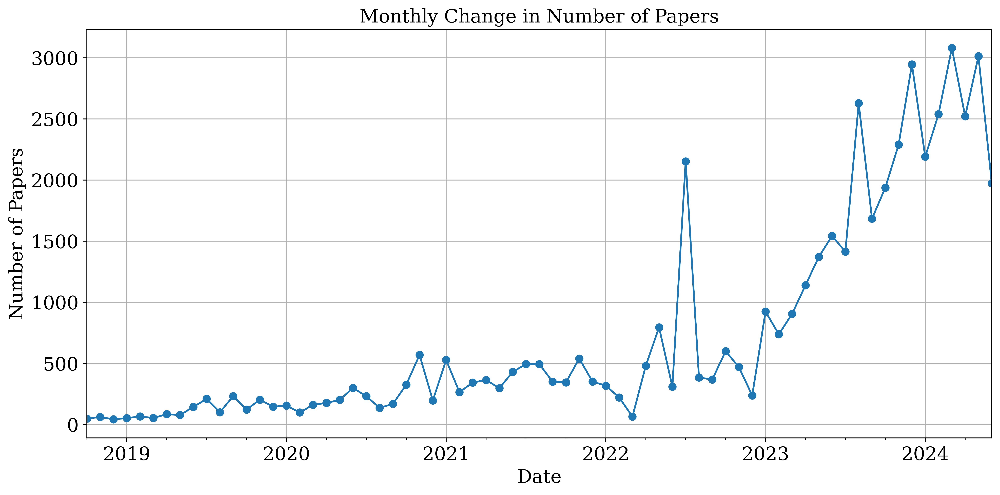

In [4]:
# df.set_index('created_date', inplace=True)
# monthly_papers = df.resample('M').size()

# plt.figure(figsize=(12, 6))
# monthly_papers.plot(kind='line', marker='o')
# plt.title('Monthly Change in Number of Papers')
# plt.xlabel('Date')
# plt.ylabel('Number of Papers')
# plt.grid(True)
# plt.tight_layout()
# plt.show()

In [5]:
for i in df.columns:
    print(i)

id
doi
title
display_name
relevance_score
publication_year
publication_date
language
type
type_crossref
indexed_in
countries_distinct_count
institutions_distinct_count
corresponding_author_ids
corresponding_institution_ids
apc_list
apc_paid
fwci
has_fulltext
cited_by_count
is_retracted
is_paratext
locations_count
datasets
versions
referenced_works_count
referenced_works
related_works
ngrams_url
cited_by_api_url
updated_date
ids.openalex
ids.doi
ids.mag
primary_location.is_oa
primary_location.landing_page_url
primary_location.pdf_url
primary_location.source.id
primary_location.source.display_name
primary_location.source.issn_l
primary_location.source.issn
primary_location.source.is_oa
primary_location.source.is_in_doaj
primary_location.source.host_organization
primary_location.source.host_organization_name
primary_location.source.host_organization_lineage
primary_location.source.host_organization_lineage_names
primary_location.source.type
primary_location.license
primary_location.licens

In [6]:
field_dict = {'Computer Science':'Computer Science',
              'Neuroscience':'Neuroscience',
              'Decision Sciences':'Decision Science',
              'Psychology':'Psychology',
              'Medicine':'Medicine',
              'Biochemistry, Genetics and Molecular Biology':'Bio, Gen & Mol',
              'Earth and Planetary Sciences': 'Earth & Plan Science',
              'Social Sciences':'Social Science',
              'Physics and Astronomy':'Physics & Astronomy',
              'Health Professions':'Health Professions',
              'Environmental Science':'Envir Science',
              'Arts and Humanities':'Arts & Humanities',
              'Energy':'Energy',
              'Engineering':'Engineering',
              'Business, Management and Accounting':'Bus, Mgmt & Acct',
              'Economics, Econometrics and Finance':'Econ, Econom & Fin',
              'Agricultural and Biological Sciences':'Agri & Bio Science',
              'Materials Science':'Materials Science',
              'Chemistry':'Chemistry',
              'Nursing':'Nursing',
              'Veterinary':'Veterinary',
              'Mathematics':'Mathematics',
              'Pharmacology, Toxicology and Pharmaceutics':'Pharmacology Science',
              'Dentistry':'Dentistry',
              'Immunology and Microbiology':'Immuno & Microbio',
              'Chemical Engineering':'Chemical Engineering'
              }

In [7]:
#discipline_list = df['primary_topic.field.display_name'].unique()
#discipline_list = discipline_list[~pd.isnull(discipline_list)]

df['primary_field'] = df['primary_topic.field.display_name'].replace(field_dict)
primary_fields_counts = df['primary_field'].value_counts()

def clean_fields(field_list):
    cleaned_fields = [f.strip() for f in field_list if f.strip()]
    mapped_fields = [field_dict.get(f, f) for f in cleaned_fields]
    fields = list(set(mapped_fields))
    return fields

df['fields'] = df['topics.field.display_name'].fillna('').astype(str).str.split('|')
df['fields'] = df['fields'].apply(clean_fields)

exploded_df = df.explode('fields')
field_counts = exploded_df['fields'].value_counts().reset_index()
field_counts.columns = ['fields', 'count']
field_counts.set_index('fields', inplace=True)
field_counts

,count
fields,
Computer Science,40660
Medicine,9821
Social Science,6037
Decision Science,2604
"Bio, Gen & Mol",2523
Psychology,2447
Engineering,2408
Health Professions,1484
"Bus, Mgmt & Acct",1227


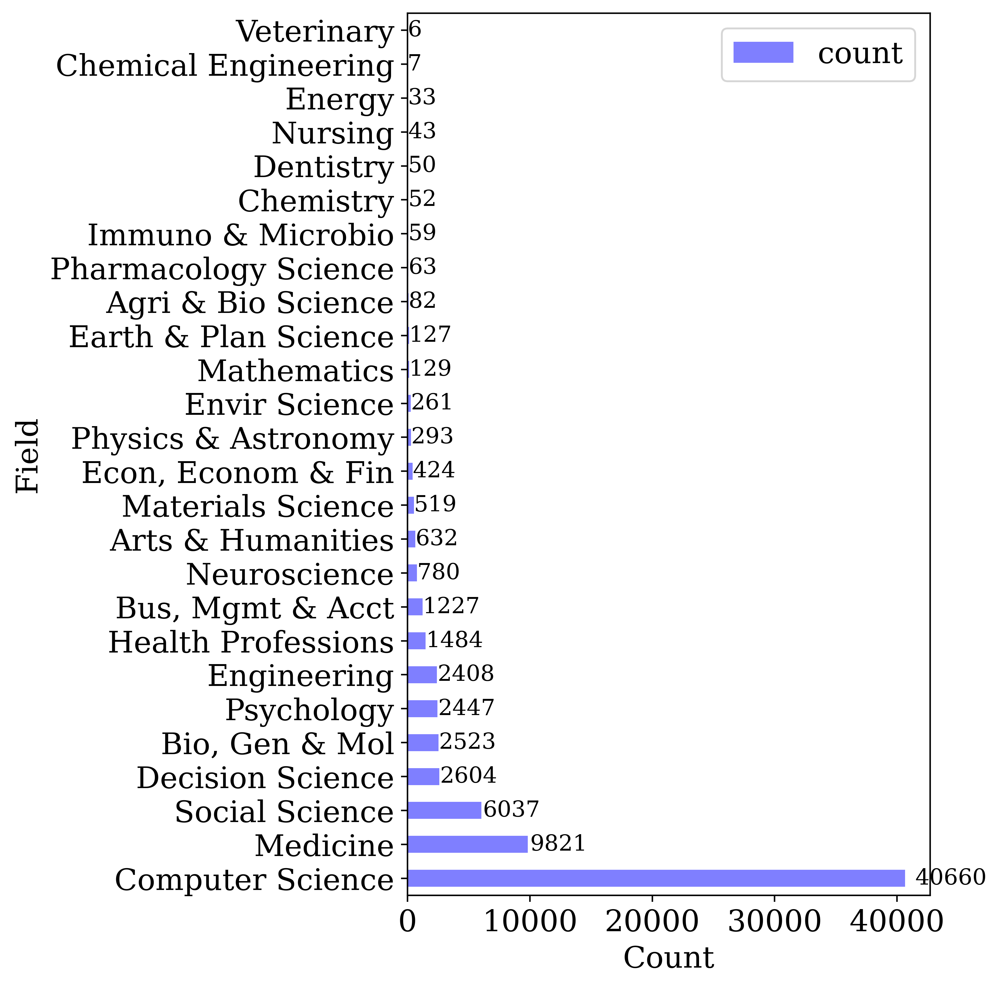

In [8]:
# Plot the bar chart
fig, ax = plt.subplots(figsize=(5, 8.5))
bars = field_counts.plot(kind='barh', ax=ax, color='blue', alpha=0.5)

# Add counts on top of each bar
for bar in bars.patches:
    ax.text(bar.get_width() + bar.get_width() * 0.02, bar.get_y() + bar.get_height() / 2,
            int(bar.get_width()), ha='left', va='center', color='black', fontsize=12)

#ax.set_title('Paper count by field')
ax.set_xlabel('Count')
ax.set_ylabel('Field')
plt.show()

In [9]:
top_fields = field_counts.index.tolist()[:12]
top_fields

['Computer Science',
 'Medicine',
 'Social Science',
 'Decision Science',
 'Bio, Gen & Mol',
 'Psychology',
 'Engineering',
 'Health Professions',
 'Bus, Mgmt & Acct',
 'Neuroscience',
 'Arts & Humanities',
 'Materials Science']

### Extract author information

In [10]:
import ast

def extract_institutions(row):
    parts = row.split('|')
    affliation_countries = []
    affliation_insitutions = []
    affliation_types = []
    for part in parts:
        try:
            data = ast.literal_eval(part)
            affliation_countries.append([item['country_code'] for item in data][0])
            affliation_insitutions.append([item['display_name'] for item in data][0])
            affliation_types.append([item['type'] for item in data][0])
        except:
            pass
    return affliation_countries, affliation_insitutions, affliation_types

df['authorships.institutions'] = df['authorships.institutions'].astype(str)
df['affiliation_countries'], df['affiliation_institutions'], df['affiliation_types'] = zip(*df['authorships.institutions'].apply(extract_institutions))

In [11]:
def extract_departments(row):
    departments = []
    parts = row.split('|')
    for part in parts:
        try:
            institutions = ast.literal_eval(part)
            institution = institutions[0]
            department = institution.split(',')[0]
            departments.append(department)
        except:
            pass
    
    return departments

df['authorships.raw_affiliation_strings'] = df['authorships.raw_affiliation_strings'].astype(str)
df['author_raw_affiliation'] = df['authorships.raw_affiliation_strings'].apply(extract_departments)
df.head(5)

,id,doi,title,display_name,relevance_score,publication_year,publication_date,language,type,type_crossref,...,grants.award_id,counts_by_year.year,counts_by_year.cited_by_count,possible,primary_field,fields,affiliation_countries,affiliation_institutions,affiliation_types,author_raw_affiliation
created_date,,,,,,,,,,,,,,,,,,,,,
2018-10-12,https://openalex.org/W2894751016,https://doi.org/10.1145/3264560.3264562,Fuzzy Cross Language Plagiarism Detection (Ara...,Fuzzy Cross Language Plagiarism Detection (Ara...,3.131447,2018,2018-08-03,en,article,proceedings-article,...,NaN,2022|2020,2|1,Yes,Computer Science,"[Computer Science, Social Science]","[MA, MA, MA, MA]","[Université Sultan Moulay Slimane, Université ...","[education, education, education, education]","[LMACS laboratory, LMACS laboratory, TIAD labo..."
2018-10-12,https://openalex.org/W2895196554,https://doi.org/10.1109/aipr.2018.8707407,End-to-End Text Classification via Image-based...,End-to-End Text Classification via Image-based...,2.991472,2018,2018-10-01,en,preprint,proceedings-article,...,NaN,2021|2020,1|1,Yes,Computer Science,[Computer Science],"[JP, JP, JP]","[Hosei University, Hosei University, Hosei Uni...","[education, education, education]","[Major in Applied Informatics, Major in Applie..."
2018-10-12,https://openalex.org/W2894627709,https://doi.org/10.1162/tacl_a_00242,Integrating Weakly Supervised Word Sense Disam...,Integrating Weakly Supervised Word Sense Disam...,5.379664,2018,2018-12-01,en,article,journal-article,...,NaN,2023|2022|2021|2020|2019,3|3|7|6|4,Yes,Computer Science,[Computer Science],"[CH, CH, CH]","[Idiap Research Institute, Idiap Research Inst...","[facility, facility, education]","[Nuance Communications., Idiap Research Instit..."
2018-10-12,https://openalex.org/W2895767618,https://doi.org/10.1088/1742-6596/1087/3/032003,Fine-Grained Named Entity Recognition in Quest...,Fine-Grained Named Entity Recognition in Quest...,0.513919,2018,2018-09-01,en,article,journal-article,...,NaN,NaN,NaN,Yes,Computer Science,[Computer Science],"[CN, CN, CN]","[Xihua University, Xihua University, Xihua Uni...","[education, education, education]","[Xihua University, Xihua University, Xihua Uni..."
2018-10-12,https://openalex.org/W2895311079,https://doi.org/10.1177/0361198118798736,Crowdsourcing Incident Information for Emergen...,Crowdsourcing Incident Information for Emergen...,3.814583,2018,2018-10-01,en,article,journal-article,...,NaN,2024|2022|2021|2019,1|1|3|3,Yes,Social Science,"[Social Science, Computer Science]","[US, US, US, US]","[New York University, New York University, Uni...","[education, education, government, education]","[C2SMART Center, C2SMART Center, C2SMART Cente..."


In [12]:
json_file = 'author_affiliations.json'

with open(json_file, 'r') as f:
    affiliation_to_discipline = json.load(f)

def map_to_discipline(affiliations):
    disciplines = []
    for affiliation in affiliations:
        if affiliation in affiliation_to_discipline:
            disciplines.append(affiliation_to_discipline[affiliation])
    return disciplines

# Apply the mapping function to create a new column
df['affiliation_departments'] = df['author_raw_affiliation'].apply(map_to_discipline)
df['affiliation_departments'] = df['affiliation_departments'].apply(lambda x: [] if all(elem == 'None' for elem in x) else x)
df.head(5)

,id,doi,title,display_name,relevance_score,publication_year,publication_date,language,type,type_crossref,...,counts_by_year.year,counts_by_year.cited_by_count,possible,primary_field,fields,affiliation_countries,affiliation_institutions,affiliation_types,author_raw_affiliation,affiliation_departments
created_date,,,,,,,,,,,,,,,,,,,,,
2018-10-12,https://openalex.org/W2894751016,https://doi.org/10.1145/3264560.3264562,Fuzzy Cross Language Plagiarism Detection (Ara...,Fuzzy Cross Language Plagiarism Detection (Ara...,3.131447,2018,2018-08-03,en,article,proceedings-article,...,2022|2020,2|1,Yes,Computer Science,"[Computer Science, Social Science]","[MA, MA, MA, MA]","[Université Sultan Moulay Slimane, Université ...","[education, education, education, education]","[LMACS laboratory, LMACS laboratory, TIAD labo...",[]
2018-10-12,https://openalex.org/W2895196554,https://doi.org/10.1109/aipr.2018.8707407,End-to-End Text Classification via Image-based...,End-to-End Text Classification via Image-based...,2.991472,2018,2018-10-01,en,preprint,proceedings-article,...,2021|2020,1|1,Yes,Computer Science,[Computer Science],"[JP, JP, JP]","[Hosei University, Hosei University, Hosei Uni...","[education, education, education]","[Major in Applied Informatics, Major in Applie...","[Applied Informatics, Applied Informatics, App..."
2018-10-12,https://openalex.org/W2894627709,https://doi.org/10.1162/tacl_a_00242,Integrating Weakly Supervised Word Sense Disam...,Integrating Weakly Supervised Word Sense Disam...,5.379664,2018,2018-12-01,en,article,journal-article,...,2023|2022|2021|2020|2019,3|3|7|6|4,Yes,Computer Science,[Computer Science],"[CH, CH, CH]","[Idiap Research Institute, Idiap Research Inst...","[facility, facility, education]","[Nuance Communications., Idiap Research Instit...",[]
2018-10-12,https://openalex.org/W2895767618,https://doi.org/10.1088/1742-6596/1087/3/032003,Fine-Grained Named Entity Recognition in Quest...,Fine-Grained Named Entity Recognition in Quest...,0.513919,2018,2018-09-01,en,article,journal-article,...,NaN,NaN,Yes,Computer Science,[Computer Science],"[CN, CN, CN]","[Xihua University, Xihua University, Xihua Uni...","[education, education, education]","[Xihua University, Xihua University, Xihua Uni...",[]
2018-10-12,https://openalex.org/W2895311079,https://doi.org/10.1177/0361198118798736,Crowdsourcing Incident Information for Emergen...,Crowdsourcing Incident Information for Emergen...,3.814583,2018,2018-10-01,en,article,journal-article,...,2024|2022|2021|2019,1|1|3|3,Yes,Social Science,"[Social Science, Computer Science]","[US, US, US, US]","[New York University, New York University, Uni...","[education, education, government, education]","[C2SMART Center, C2SMART Center, C2SMART Cente...","[None, None, SMART Center, None]"


### Calculate Entropy

In [13]:
def shannon_entropy(institution_list):
    value, counts = np.unique(institution_list, return_counts=True)
    probabilities = counts / len(institution_list)
    entropy = -np.sum(probabilities * np.log2(probabilities))
    return entropy

def calculate_entropy(df, column_name):
    df[column_name] = df[column_name].apply(lambda x: ['' if elem == 'None' else elem for elem in x])
    df[column_name] = df[column_name].apply(lambda x: ['' if elem is None else elem for elem in x])
    df[column_name] = df[column_name].apply(lambda x: [elem for elem in x if elem.strip() != ''])
    df = df[df[column_name].apply(lambda x: len(x) > 0)]
    df['entropy'] = df[column_name].apply(shannon_entropy)
    return df

In [14]:
country_df = calculate_entropy(df, 'affiliation_countries')
institution_df = calculate_entropy(df, 'affiliation_institutions')
type_df = calculate_entropy(df, 'affiliation_types')
department_df = calculate_entropy(df, 'affiliation_departments')

print(len(df), len(country_df), len(institution_df), len(type_df), len(department_df))

/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_34534/2821532418.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['entropy'] = df[column_name].apply(shannon_entropy)
/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_34534/2821532418.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['entropy'] = df[column_name].apply(shannon_entropy)
/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_34534/2821532418.py:12: SettingWithCopyWarning: 
A value is trying to be set on a cop

50391 25927 25933 25933 16645


/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_34534/2821532418.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['entropy'] = df[column_name].apply(shannon_entropy)


In [15]:
# columns = ['doi','title','created_date', 'type', 'abstract', 'primary_field', 'fields', 'affiliation_countries','affiliation_institutions', 'affiliation_departments','entropy']
# insitution_df = institution_df[columns]
# insitution_df.to_csv('institution_entropy.csv', index=False)
# department_df = department_df[columns]
# department_df.to_csv('department_entropy.csv', index=False)

In [16]:
# country_df[['title', 'doi', 'primary_field', 'fields', 'created_date', 'affiliation_countries', 'entropy']].to_excel('affiliation_countries_entropy.xlsx', index=False)
# institution_df[['title', 'doi', 'primary_field', 'fields', 'created_date', 'affiliation_institutions', 'entropy']].to_excel('affiliation_institutions_entropy.xlsx', index=False)
# type_df[['title', 'doi', 'primary_field', 'fields', 'created_date', 'affiliation_types', 'entropy']].to_excel('affiliation_types_entropy.xlsx', index=False)
# department_df[['title', 'doi', 'primary_field', 'fields', 'created_date', 'affiliation_departments', 'entropy']].to_excel('affiliation_disciplines_entropy.xlsx', index=False)

In [17]:
import numpy as np
from scipy import stats

sample = "Q"

# Filter and set index
filtered_df = df[(df['created_date'] <= '2024-07-01') & (df['created_date'] >= '2019-01-01')]
filtered_df1 = institution_df[(institution_df['created_date'] <= '2024-07-01') & (institution_df['created_date'] >= '2019-01-01')]
filtered_df2 = department_df[(department_df['created_date'] <= '2024-07-01') & (department_df['created_date'] >= '2019-01-01')]

filtered_df.set_index('created_date', inplace=True)
filtered_df1.set_index('created_date', inplace=True)
filtered_df2.set_index('created_date', inplace=True)

def add_regression_line(ax, x, y, color):
    x_numeric = np.array([(d - x[0]).days for d in x])
    slope, intercept, r_value, p_value, std_err = stats.linregress(x_numeric, y)
    line = slope * x_numeric + intercept
    ax.plot(x, line, color=color, linestyle='--')
    ax.text(0.05, 0.4, f'r = {r_value:.2f}', 
            transform=ax.transAxes,
            color=color, 
            fontsize=16, 
            fontweight='bold',
            ha='left', 
            va='top')

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8), sharex=True)

# Institution entropy plot
avg1 = filtered_df1['entropy'].resample(sample).mean()
avg1.index = avg1.index - pd.DateOffset(months=3)
ax1.plot(avg1.index, avg1, marker='o', linestyle='-', 
         color='b', alpha=0.5, markerfacecolor='none', 
         markeredgewidth=3, markeredgecolor='b', label='Institution Entropy')

add_regression_line(ax1, avg1.index, avg1.values, 'b')

ax1.set_ylabel('Entropy', color='b')
ax1.set_ylim(0, 0.8)
ax1.tick_params(axis='y', labelcolor='b')

ax1_2 = ax1.twinx()
counts = filtered_df['id'].resample(sample).count()
counts.index = counts.index - pd.DateOffset(months=3)
ax1_2.plot(counts.index, counts, linestyle='--', marker='o', color='r', 
           alpha=0.5, markerfacecolor='none', markeredgewidth=2, markeredgecolor='r', label='Paper Count')
ax1_2.set_ylabel('Count', color='r')
ax1_2.tick_params(axis='y', labelcolor='r')
ax1_2.set_ylim(0, max(ax1_2.get_ylim()[1], counts.max()))

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax1_2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
ax1.axvline(pd.to_datetime('2022-12-01') - pd.DateOffset(months=3), color='gray', linestyle='--', linewidth=2, alpha=0.5)

# Department entropy plot
avg2 = filtered_df2['entropy'].resample(sample).mean()
avg2.index = avg2.index - pd.DateOffset(months=3)
ax2.plot(avg2.index, avg2, marker='s', linestyle='-', 
         color='g', alpha=0.5, markerfacecolor='none', 
         markeredgewidth=3, markeredgecolor='g', label='Department Entropy')

add_regression_line(ax2, avg2.index, avg2.values, 'g')

ax2.set_xlabel('Date')
ax2.set_ylabel('Entropy', color='g')
ax2.set_ylim(0, 0.8)
ax2.tick_params(axis='y', labelcolor='g')

ax2_2 = ax2.twinx()
ax2_2.plot(counts.index, counts, linestyle='--', marker='o', color='r', 
           alpha=0.5, markerfacecolor='none', markeredgewidth=2, markeredgecolor='r', label='Paper Count')
ax2_2.set_ylabel('Count', color='r')
ax2_2.tick_params(axis='y', labelcolor='r')
ax2_2.set_ylim(0, max(ax2_2.get_ylim()[1], counts.max()))
ax2.axvline(pd.to_datetime('2022-12-01') - pd.DateOffset(months=3), color='gray', linestyle='--', linewidth=2, alpha=0.5)

lines1, labels1 = ax2.get_legend_handles_labels()
lines2, labels2 = ax2_2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# plt.gcf().autofmt_xdate()  # Rotate and align the tick labels
plt.tight_layout()
plt.show()

KeyError: 'created_date'

### Entropy by each field

In [ ]:
from scipy import stats

def plot_temporal(df, column, field, ax, sample='Y', is_first=False, is_last=False, primary_color='b'):
    # Filter the DataFrame based on the date range and topic
    if column == 'fields':
        df = df.explode(column).reset_index(drop=True)
        filtered_df = df[(df['created_date'] <= pd.to_datetime('2024-07-01')) & (df['created_date'] >= pd.to_datetime('2019-01-01'))]
        filtered_df = filtered_df[filtered_df['fields'] == field]
    elif column == 'primary_field':
        filtered_df = df[(df['created_date'] <= pd.to_datetime('2024-07-01')) & (df['created_date'] >= pd.to_datetime('2019-01-01'))]
        filtered_df = filtered_df[filtered_df['primary_field'] == field]
    
    filtered_df.set_index('created_date', inplace=True)
    
    # Calculate mean and standard error of the mean (SEM)
    avg = filtered_df['entropy'].resample(sample).mean()
    sem = filtered_df['entropy'].resample(sample).sem()

    # Calculate and plot the 95% CI using the t-distribution
    ci = sem * stats.t.ppf((1 + 0.95) / 2., filtered_df['entropy'].resample(sample).count() - 1)
    ax.errorbar(avg.index-pd.DateOffset(months=9), avg, yerr=ci, marker='o', linestyle='-', 
                color=primary_color, ecolor=primary_color, alpha=0.5, capsize=5, markerfacecolor='none', 
                markeredgewidth=3, markeredgecolor=primary_color)
    ax.set_title(field)
    ax.set_xlabel('Date')
    ax.set_ylim(-0.05, 2)
    ax.tick_params(axis='y', labelcolor=primary_color)
    #ax.grid(True)
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%y'))
    
    # Add secondary y-axis for counts for all subplots
    ax2 = ax.twinx()
    counts = filtered_df['entropy'].resample(sample).count()
    ax2.plot(counts.index-pd.DateOffset(months=9), counts, linestyle='--', marker='o', color='r', 
             alpha=0.5, markerfacecolor='none', markeredgewidth=2, markeredgecolor='r')
    ax2.tick_params(axis='y', labelcolor='r')
    ax2.set_ylim(0, ax2.get_ylim()[1])

    # Customize y-axis labels and visibility based on position
    if is_first:
        ax.set_ylabel('Entropy', color=primary_color)
    if is_last:
        ax2.set_ylabel('Counts', color='r')
        ax2.yaxis.set_label_position('right')
        ax2.spines['right'].set_visible(True)
    else:
        ax2.yaxis.set_tick_params(left=False, right=False, labelleft=False, labelright=False)

    if not is_first:
        ax.yaxis.set_tick_params(labelleft=False)
    if not is_last:
        ax2.yaxis.set_tick_params(labelright=False)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax2.yaxis.set_ticks_position('right')

    # Add vertical line at "2022-12-01"
    ax.axvline(pd.to_datetime('2022-12-01')-pd.DateOffset(months=9), color='gray', linestyle='--', linewidth=2, alpha=0.5)

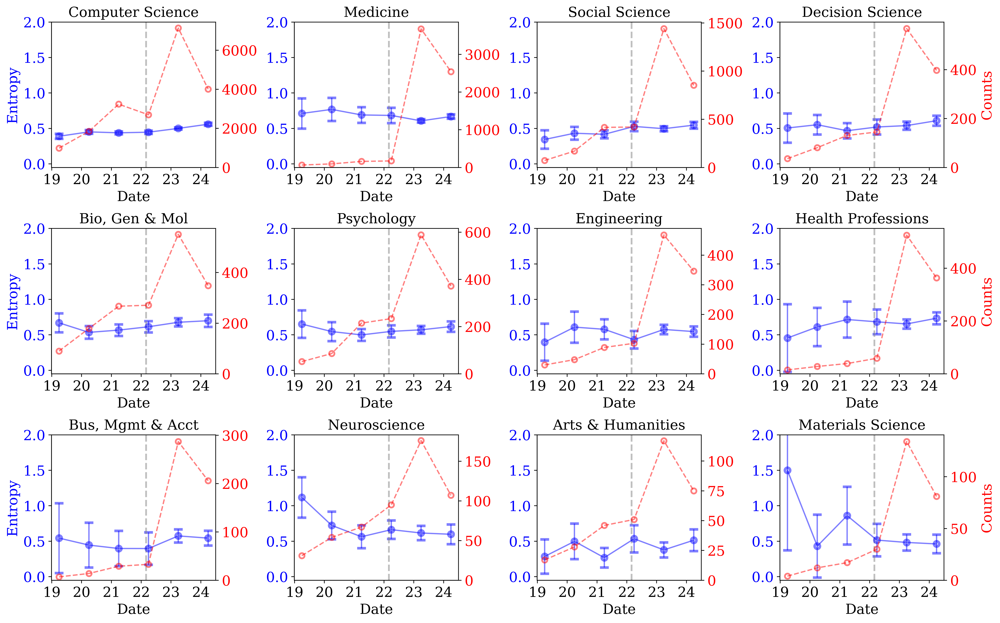

In [ ]:
fig, axs = plt.subplots(3, 4, figsize=(16, 10))
axs = axs.flatten()
column = 'fields' # can change to 'primary_field'

for i, field in enumerate(top_fields):
    row_index = i // 4 
    is_first = (i % 4 == 0)
    is_last = (i % 4 == 3)
    plot_temporal(institution_df, column, field, axs[i], sample='Y', is_first=is_first, is_last=is_last, primary_color='b')

plt.tight_layout(pad=1.0)
plt.show()

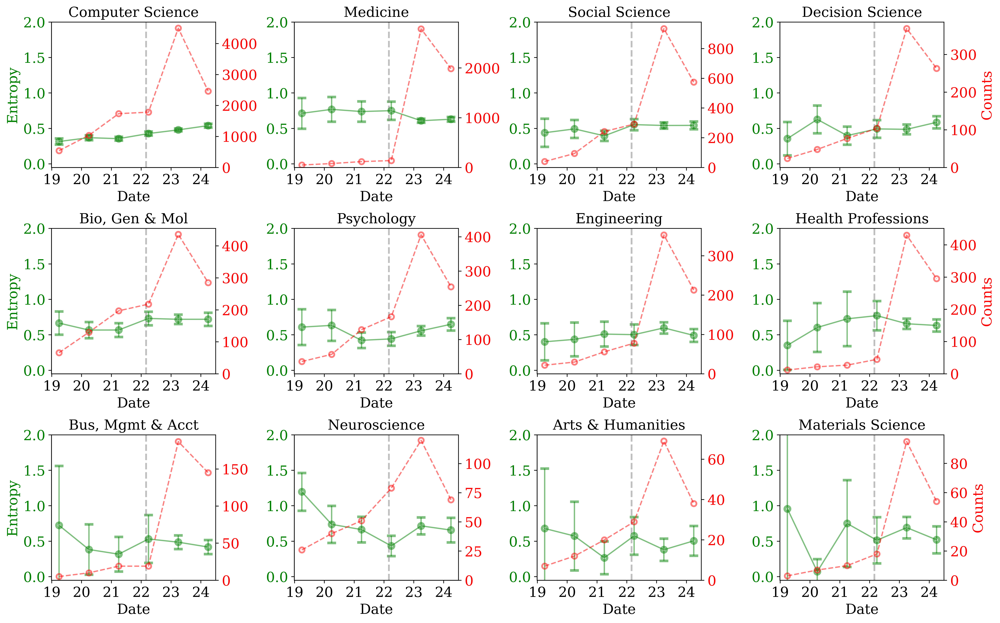

In [ ]:
fig, axs = plt.subplots(3, 4, figsize=(16, 10))
axs = axs.flatten()
column = 'fields' # can change to 'primary_field'

for i, field in enumerate(top_fields):
    row_index = i // 4 
    is_first = (i % 4 == 0)
    is_last = (i % 4 == 3)
    plot_temporal(department_df, column, field, axs[i], sample='Y', is_first=is_first, is_last=is_last, primary_color='g')

plt.tight_layout(pad=1.0)
plt.show()

In [ ]:
def wilcoxon_test_field(field1, field2, df, column):
    entropy1 = df[df[column] == field1]['entropy']
    entropy2 = df[df[column] == field2]['entropy']
    _, p_value = stats.ranksums(entropy1, entropy2)
    return p_value


def create_plots(df, column, fields):
    # Sort the dataframe based on the order of topics
    if column == 'fields':
        df = df.explode(column).reset_index(drop=True)
    dff = df[df[column].isin(fields)].copy()
    dff['field_order'] = dff[column].map({field: i for i, field in enumerate(fields)})
    dff = dff.sort_values('field_order')

    wilcoxon_matrix = [[wilcoxon_test_field(f1, f2, dff, column) for f2 in fields] for f1 in fields]
    wilcoxon_array = np.array(wilcoxon_matrix)

    # Create the "blue" color
    blue_color = 'blue'
    alphas = np.linspace(0.1, 0.6, 5)
    colors = [mcolors.to_rgba(blue_color, alpha=alpha) for alpha in alphas]
    colors.reverse()
    bounds = [0, 0.0001, 0.001, 0.01, 0.05, 1.0]
    cmap = mcolors.LinearSegmentedColormap.from_list("CustomBlues", colors, N=256)
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    # Create a figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Box plot
    sns.boxplot(x=column, y='entropy', data=dff, ax=ax1,
                order=fields,
                color='white', width=0.6, linewidth=2, fliersize=5,
                medianprops={"color": blue_color, "linewidth": 2},
                boxprops={"edgecolor": blue_color, "facecolor": "white"},
                whiskerprops={"color": blue_color, "linewidth": 2},
                capprops={"color": blue_color, "linewidth": 2},
                flierprops={"markeredgecolor": blue_color, "markerfacecolor": "white"})

    ax1.set_title('Distribution of Shannon Entropy across Fields')
    ax1.set_xlabel('Field')
    ax1.set_ylabel('Shannon Entropy')
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha='right')

    # Heatmap
    sns.heatmap(wilcoxon_array,
                annot=False,
                cmap=cmap,
                norm=norm,
                xticklabels=fields,
                yticklabels=fields,
                ax=ax2,
                cbar=False,
                linewidths=0.8,
                linecolor='white')

    ax2.set_title('Wilcoxon Rank-Sum Test between Fields')

    # Create a custom colorbar for the heatmap
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax2)
    cbar.set_ticks([0.00005, 0.00055, 0.0055, 0.03, 0.525])
    cbar.set_ticklabels(['p < 0.0001', 'p < 0.001', 'p < 0.01', 'p < 0.05', 'p ≥ 0.05'])

    plt.tight_layout()
    plt.show()

/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_24788/3961589746.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha='right')


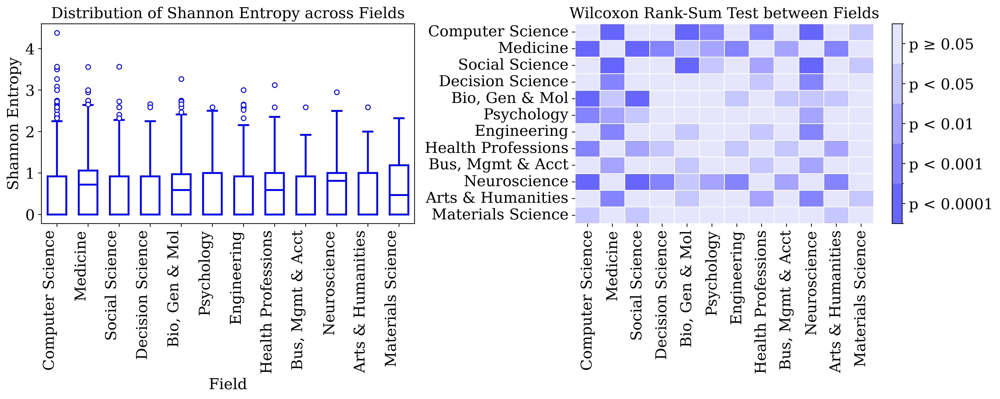

/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_24788/3961589746.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha='right')


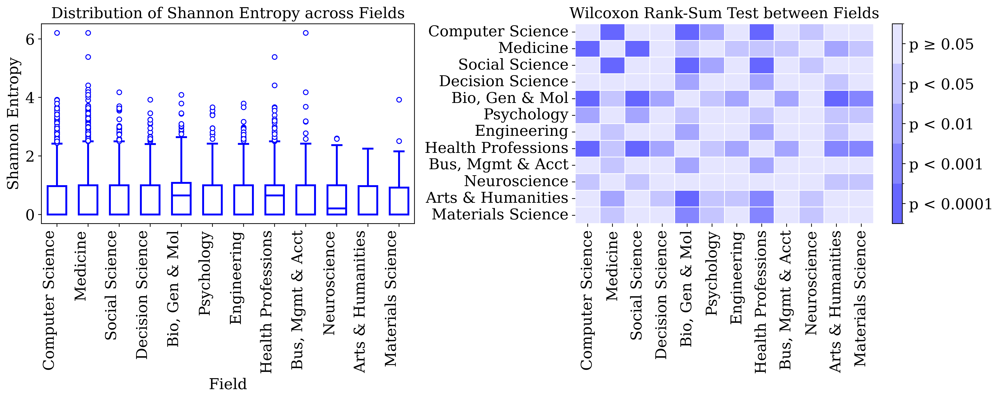

In [ ]:
created_date = '2022-12-01'
column = 'fields' # can change to 'primary_field'

sub1_df = institution_df[(institution_df['created_date'] <= pd.to_datetime(created_date))]
sub2_df = institution_df[(institution_df['created_date'] > pd.to_datetime(created_date))]

create_plots(sub1_df, column, top_fields)
create_plots(sub2_df, column, top_fields)

/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_24788/3961589746.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha='right')


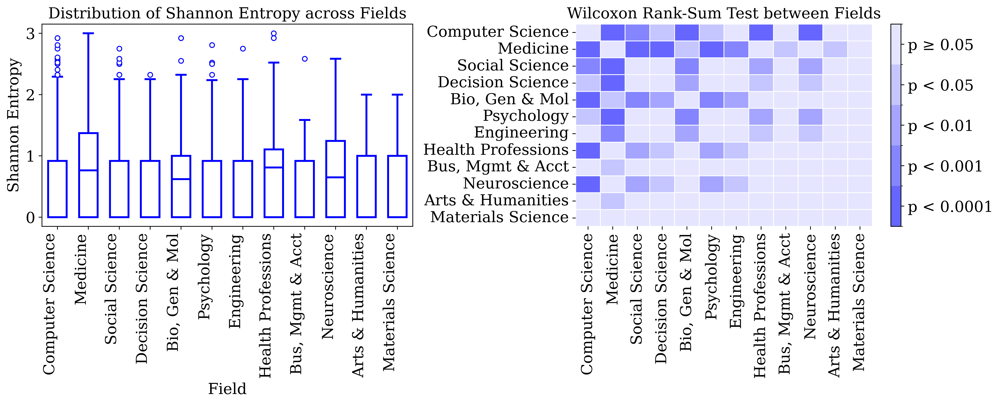

/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_24788/3961589746.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha='right')


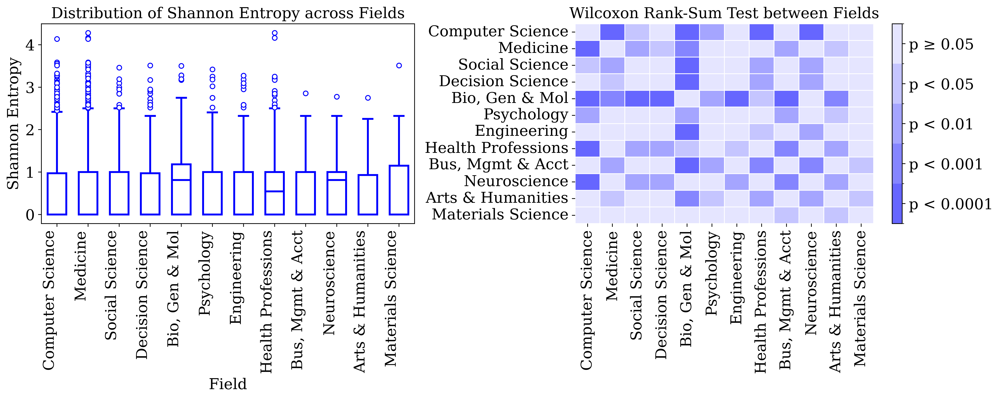

In [ ]:
created_date = '2022-12-01'
column = 'fields' # can change to 'primary_field'

sub1_df = department_df[(department_df['created_date'] <= pd.to_datetime(created_date))]
sub2_df = department_df[(department_df['created_date'] > pd.to_datetime(created_date))]

create_plots(sub1_df, column, top_fields)
create_plots(sub2_df, column, top_fields)

In [ ]:
def wilcoxon_test_temporal(df, column, field, created_date):
    df1 = df[df['created_date'] <= created_date]
    df2 = df[df['created_date'] > created_date]
    entropy1 = df1[df1[column] == field]['entropy']
    entropy2 = df2[df2[column] == field]['entropy']
    _, p_value = stats.ranksums(entropy1, entropy2)
    return p_value


def create_comparison(df, column, fields, created_date):
    # Initialize the plot
    fig, ax = plt.subplots(figsize=(10, 6))
    box_data = {'Field': [], 'Entropy': [], 'Group': []}
    p_values = []

    if column == 'fields':
        df = df.explode(column).reset_index(drop=True)

    for i, field in enumerate(fields):
        # Extract entropy values before and after created_date for each topic
        entropy_before = df[(df[column] == field) & (df['created_date'] <= created_date)]['entropy']
        entropy_after = df[(df[column] == field) & (df['created_date'] > created_date)]['entropy']

        # Calculate Wilcoxon p-value
        p_value = wilcoxon_test_temporal(df, column, field, created_date)
        p_values.append(p_value)

        # Append data for boxplot
        box_data['Field'].append(field)
        box_data['Entropy'].append(entropy_before)
        box_data['Group'].append('Before')
        box_data['Field'].append(field)
        box_data['Entropy'].append(entropy_after)
        box_data['Group'].append('After')

    box_data_df = pd.DataFrame(box_data)

    # Flatten the lists in the 'Entropy' column to use in seaborn boxplot
    box_data_flat = {'Field': [], 'Entropy': [], 'Group': []}
    for i, row in box_data_df.iterrows():
        for entropy_value in row['Entropy']:
            box_data_flat['Field'].append(row['Field'])
            box_data_flat['Entropy'].append(entropy_value)
            box_data_flat['Group'].append(row['Group'])

    box_data_flat_df = pd.DataFrame(box_data_flat)

    # Create boxplot
    sns.boxplot(data=box_data_flat_df, x='Field', y='Entropy', hue='Group', fill=False, gap=.1,
            palette={'Before': 'blue', 'After': 'red'})

    # Add p-values above the boxes
    for i, field in enumerate(fields):
        ax.text(i, 0.8, f'{p_values[i]:.3f}', ha='center', va='center', 
                transform=ax.get_xticklabels()[i].get_transform(), fontsize=12)

    # Finalize plot
    # ax.set_title(f'Distribution of Shannon Entropy Before and After {created_date}')
    #ax.set_xlabel('Field')
    ax.set_ylabel('Shannon Entropy')
    ax.set_xticklabels(fields, rotation=90, ha='center')
    ax.legend(loc='upper right', ncol=2)
    plt.tight_layout()
    plt.show()

/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_24788/1256681671.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(fields, rotation=90, ha='center')


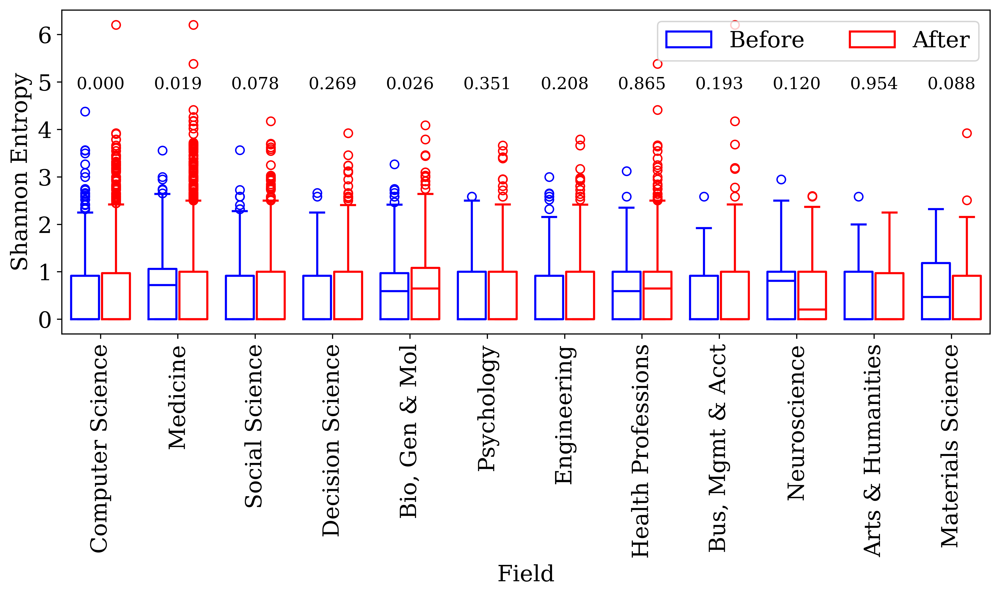

In [ ]:
created_date = '2022-12-01'
column = 'fields' # can change to "primary_field"
create_comparison(institution_df, column, top_fields, created_date)

/var/folders/cw/l2jwfcqs4yl3k4j6btbtvjtm0000gr/T/ipykernel_24788/1256681671.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(fields, rotation=90, ha='center')


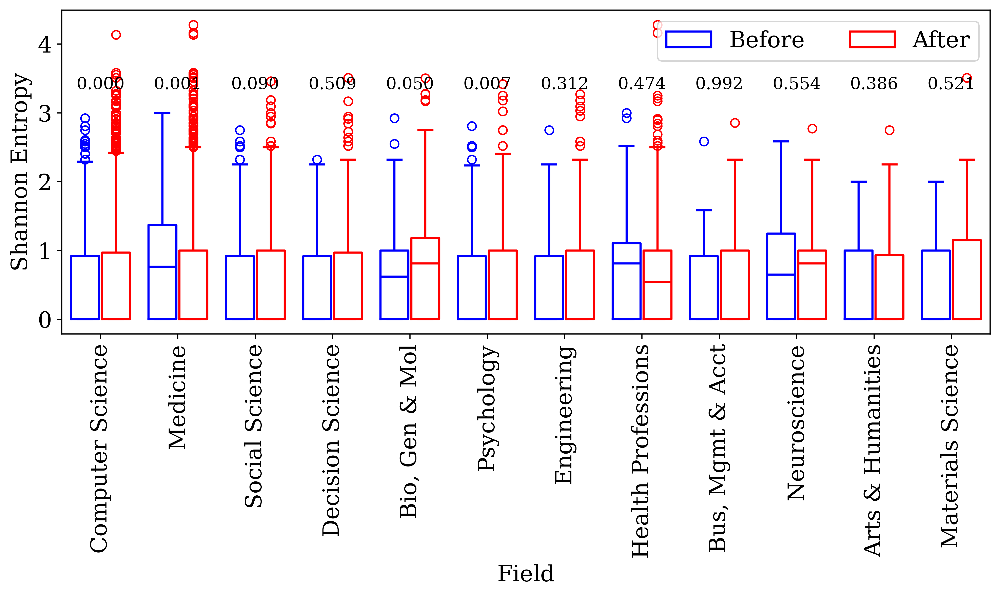

In [ ]:
created_date = '2022-12-01'
column = 'fields' # can change to "primary_field"
create_comparison(department_df, column, top_fields, created_date)